# End-to- end Multi-class dog breed classification
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow hub.

## 1. Problem
Identifying the breed of a dog given an image of a dog.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.
https://www.kaggle.com/c/dog-breed-identification/overview

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features
Some information about the data:
* unstructured data so it's probably best we use deep leaning/transfer learning.
* there are 120 breeds of dogs (120 different classes).
* There are around 10000+ images in the training set (has labels).
* There are around 10000+ images in the test set (need to predict the labels).

# Imports

In [55]:
#import TensorFlow into colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF hub version: ", hub.__version__)

#check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version:  2.15.0
TF hub version:  0.16.1
GPU not available


## Getting our data ready (turning into tensors)

With all machine leaning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into tensors (numerical representation).

In [56]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/dog vision/labels.csv")
print(labels_csv.describe())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [57]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

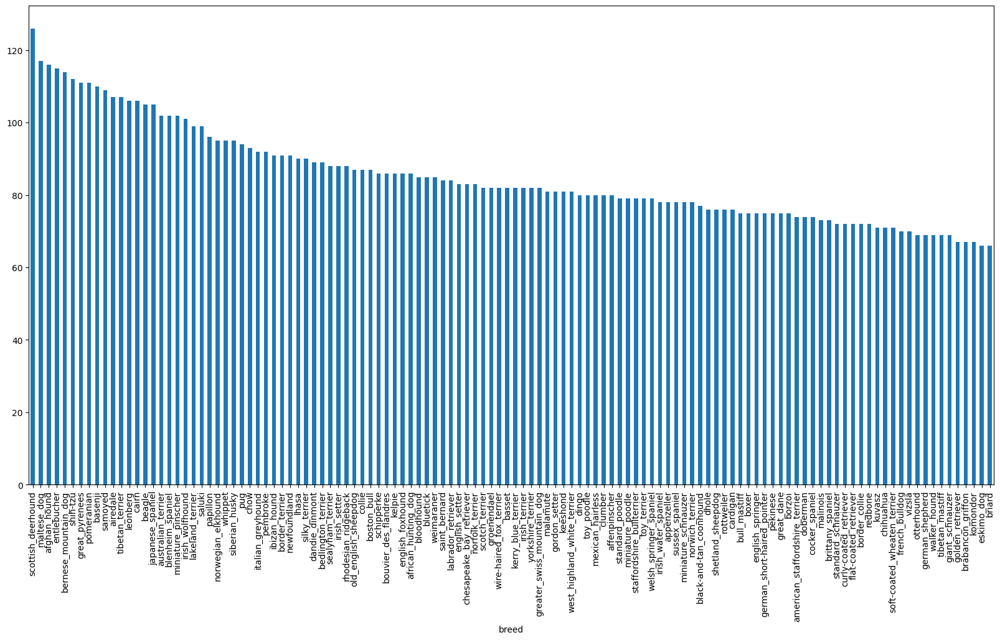

In [58]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [59]:
labels_csv['breed'].value_counts().median()

82.0

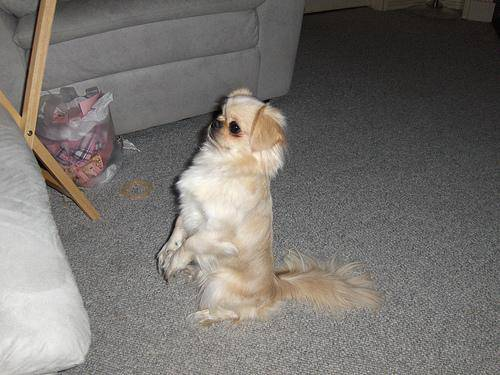

In [60]:
#let's view an image
from IPython.display import Image
Image("drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

### Getting images and their labels

Let's get a list of our image file pathnames.

In [61]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [62]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/dog vision/train/" + fname + ".jpg" for fname in labels_csv['id']]

# check the first 10
filenames[:10]

['drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [63]:
# Check wheter number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/dog vision/train/")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("filenames doesn't match with files")

Filenames match actual amount of files


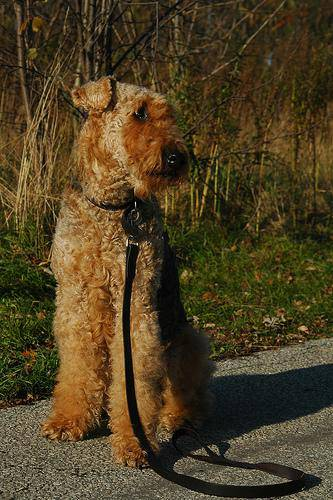

In [64]:
Image(filenames[5000])

In [65]:
labels_csv["breed"][5000]

'airedale'

In [66]:
# preparing the labels
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [67]:
len(labels)

10222

In [68]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("number of labels matches the number of filenames")
else:
  print("Does not match")

number of labels matches the number of filenames


In [69]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [70]:
print(labels[0])
labels[0]  == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [71]:
#turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [72]:
len(boolean_labels)

10222

In [73]:
# Example: turning noolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds == labels[0])) #index where the label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating a validation test

In [74]:
# Setup X & y variables
X = filenames
y = boolean_labels

#set number of images to use for experimenting

In [75]:
NUM_IMAGES = 5000 #@param {type:"slider", min: 1000, max: 10000, step: 1000}

In [76]:
# split our data into train and validation sets
from sklearn.model_selection import train_test_split

# split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=13)

In [77]:
len(X_train), len(y_train), len(X_val), len(y_val)

(4000, 4000, 1000, 1000)

In [78]:
X_train[:5], y_train[:1]

(['drive/MyDrive/dog vision/train/433e931b6c4bb1d28fe65e8f35513248.jpg',
  'drive/MyDrive/dog vision/train/616d856ae608a00523d0b39f0a40d264.jpg',
  'drive/MyDrive/dog vision/train/07bbf36ce2c7407751219804b3d187ec.jpg',
  'drive/MyDrive/dog vision/train/65930bb65a10377f2242987a59b911dc.jpg',
  'drive/MyDrive/dog vision/train/2c55080777e6a4d52cddbd370611af06.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False,  True, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preporcessing images (turning images into Tensors)

function:
1. take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalize our image ( convert color channel values from 0-255 to 0-1)
5. resize the 'image' to be a shape of (224,224)
6. return the modfied image

In [79]:
#convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[13])
image.shape

(223, 250, 3)

In [80]:
image.max(), image.min()

(255, 0)

In [81]:
#turning image into a tensor
tf.constant(image)

<tf.Tensor: shape=(223, 250, 3), dtype=uint8, numpy=
array([[[122, 159,  81],
        [132, 169,  91],
        [138, 175,  97],
        ...,
        [144, 170, 109],
        [124, 153,  89],
        [124, 153,  89]],

       [[124, 161,  83],
        [125, 162,  84],
        [121, 158,  80],
        ...,
        [150, 176, 113],
        [144, 173, 109],
        [144, 173, 109]],

       [[130, 167,  89],
        [126, 163,  85],
        [119, 156,  78],
        ...,
        [151, 177, 112],
        [141, 170, 104],
        [141, 170, 104]],

       ...,

       [[129, 166,  96],
        [143, 180, 110],
        [127, 163,  91],
        ...,
        [158, 194, 104],
        [133, 169,  81],
        [122, 158,  70]],

       [[136, 176, 105],
        [128, 168,  97],
        [100, 138,  65],
        ...,
        [143, 182,  91],
        [134, 173,  84],
        [121, 161,  72]],

       [[175, 217, 145],
        [165, 207, 135],
        [143, 180, 110],
        ...,
        [127, 166,  7

In [82]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

In [83]:
# Create a simples function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [84]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None,batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input(no labels).
  """
  if test_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) #labels
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [85]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

In [86]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

In [87]:
import matplotlib.pyplot as plt

#create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  #setup the figure
  plt.figure(figsize=(10, 10))
  #loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


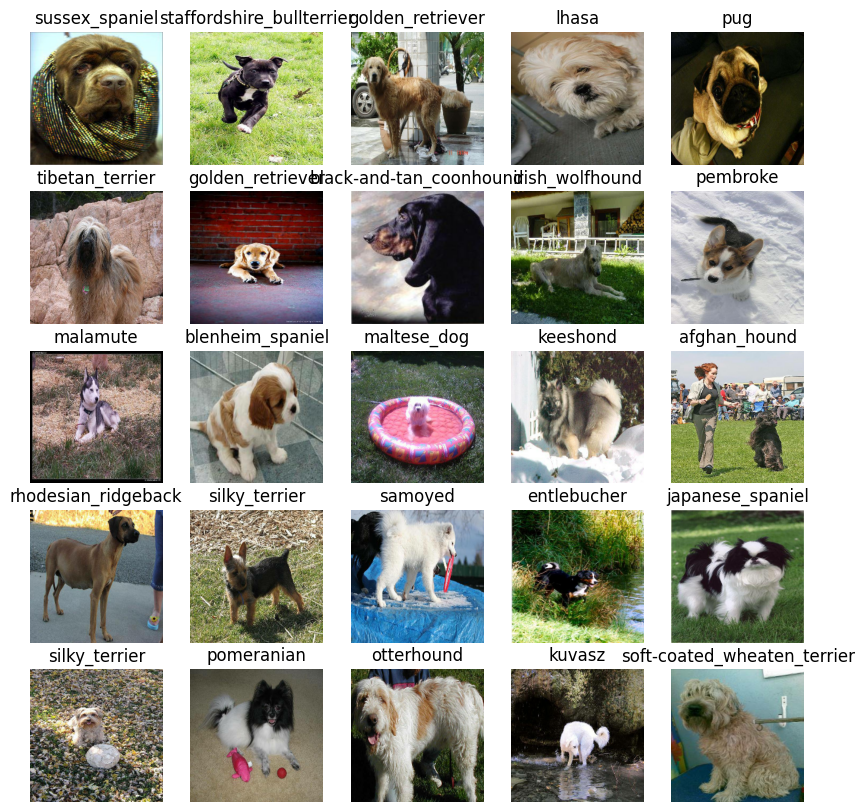

In [88]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

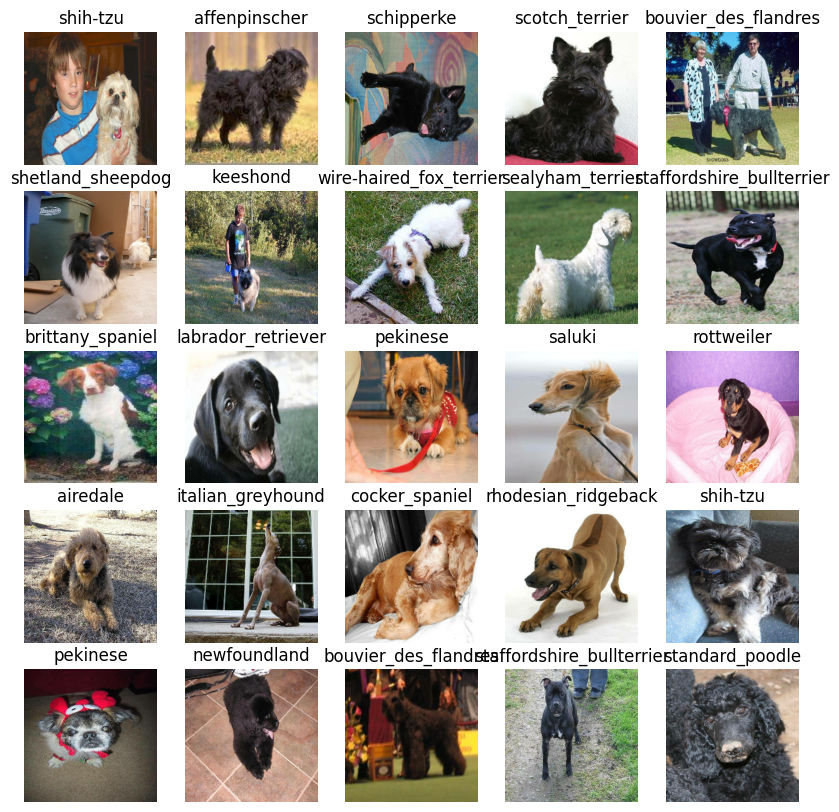

In [89]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

before we build a model, there are a few things we need to define:
* the input shape(our images shape, in the form of Tensors) to our model
* the output shape (image labels, in the form of Tensors) of or model
* the URL of the model we want to use

In [90]:
#setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

## Keras deep learning model

* takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion.
* Compiles the model (says it should be evaluated and improved).
* Builds the model.
* Returns de model


In [91]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  #setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # layer 1 (input layer)
    tf.keras.layers.Dense(units= OUTPUT_SHAPE,
                          activation="softmax") # layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [92]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions a model can use during training to do suchu things as save its progress, check its progress or stop training early if a model stops improving.


two callbacks:
1. TensorBoard which helps track our models progress
2. early stopping which prevents our model from training for too long

In [93]:
# load tensorboard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [94]:
import datetime

#create a function to build a tensorboard callback
def create_tensorboard_callback():
  #create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/dog vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [96]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience=3)

## Training a model

Our first model is only going to train on 1000 images, to make sure everything is working.

In [98]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [101]:
# create a function which train and return a trained model
def train_model():
  """
  Trains a given modedl and returns the trained version.
  """

  #create a model
  model = create_model()

  #create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data = val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [102]:
# Fit the model to the date
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
125/125 [==============================] - 661s 5s/step - loss: 2.2587 - accuracy: 0.5013 - val_loss: 0.9142 - val_accuracy: 0.7330
Epoch 2/100
125/125 [==============================] - 322s 3s/step - loss: 0.4946 - accuracy: 0.8748 - val_loss: 0.7625 - val_accuracy: 0.7580
Epoch 3/100
125/125 [==============================] - 294s 2s/step - loss: 0.2449 - accuracy: 0.9503 - val_loss: 0.7093 - val_accuracy: 0.7900
Epoch 4/100
125/125 [==============================] - 319s 3s/step - loss: 0.1456 - accuracy: 0.9772 - val_loss: 0.6758 - val_accuracy: 0.7890
Epoch 5/100
125/125 [==============================] - 317s 3s/step - loss: 0.0951 - accuracy: 0.9912 - val_loss: 0.6808 - val_accuracy: 0.7970
Epoch 6/100
125/125 [==============================] - 319s 3s/step - loss: 0.0673 - accuracy: 0.9958 - val_loss: 0.6777 - val_accuracy: 0.7920
Epoch 7/100
125/125 [=====================

## Checking the TensorBoard logs

In [104]:
%tensorboard --logdir /content/drive/MyDrive/dog\ vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [105]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

32/32 [==============================] - 73s 2s/step


array([[4.26386436e-03, 1.69299616e-04, 1.97922805e-06, ...,
        5.82133725e-06, 3.88505350e-06, 2.38189101e-03],
       [9.98193085e-01, 1.78068092e-07, 4.28653202e-08, ...,
        4.53025972e-09, 1.27151434e-05, 4.19334538e-06],
       [4.40326994e-06, 1.16766863e-08, 4.27788518e-06, ...,
        1.55378918e-10, 2.25026708e-09, 1.11964404e-07],
       ...,
       [3.86749161e-06, 8.14351082e-01, 1.57738282e-06, ...,
        1.70357758e-04, 6.14046949e-05, 3.04427434e-04],
       [2.74442277e-06, 3.62084023e-07, 7.86612418e-06, ...,
        6.06414287e-05, 6.20574243e-02, 4.23861457e-06],
       [5.72537901e-05, 3.71468644e-07, 1.66310826e-07, ...,
        6.83197925e-08, 4.66625551e-07, 2.01002622e-04]], dtype=float32)

In [111]:
# First prediction
index = 13
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.9834589e-08 1.4297811e-04 2.7090252e-08 6.0973853e-09 2.5299767e-07
 2.8560366e-06 2.1567843e-05 8.5450813e-07 6.1889921e-08 5.2940612e-07
 6.0638968e-07 2.1264144e-07 1.3229854e-05 4.9562441e-06 7.1021461e-08
 1.4730704e-05 3.9301044e-06 5.5483582e-08 7.3605072e-05 9.4014361e-09
 5.1388067e-08 3.0721222e-07 1.9098374e-07 4.4631065e-06 2.5495240e-06
 5.9180255e-08 5.2698592e-08 5.7644361e-06 7.8041253e-08 1.7914548e-06
 3.7798288e-06 1.4508970e-08 1.4529708e-05 3.8981718e-05 8.3201610e-07
 5.2315425e-08 7.7734211e-07 2.0526904e-05 6.5278607e-07 4.1146072e-06
 3.9159322e-06 5.1201688e-08 1.5927878e-06 3.0211044e-08 4.6105151e-06
 4.1748751e-07 4.1981178e-08 1.9407837e-06 1.2953991e-08 2.1196976e-03
 1.3287354e-06 3.3993587e-07 8.5909784e-07 2.5215806e-08 1.1817160e-06
 3.5458293e-06 3.1494899e-05 4.9817128e-05 2.2446574e-08 2.0116605e-08
 8.4848449e-05 1.4580845e-05 9.2825898e-09 1.6987677e-07 6.6825561e-07
 1.3372206e-08 5.8152312e-07 8.0466532e-07 4.6818809e-07 4.1070994e-08
 2.620

## Turn prediction probabilities into their respective label (easier to understand)

In [112]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'english_setter'

## Create a function to unbatch a batch dataset


In [117]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  images = []
  labels = []

#loop through unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [118]:
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.3309174 , 0.17797619, 0.05274048],
         [0.33665967, 0.17920169, 0.04120805],
         [0.35357144, 0.18823531, 0.03953081],
         ...,
         [0.16470589, 0.12156864, 0.10588236],
         [0.16470589, 0.1254902 , 0.08960081],
         [0.16470589, 0.1254902 , 0.08627451]],
 
        [[0.3309174 , 0.17797619, 0.05640757],
         [0.33665967, 0.17920169, 0.04373249],
         [0.35357144, 0.18562707, 0.04520308],
         ...,
         [0.16470589, 0.12156864, 0.10588236],
         [0.16470589, 0.1254902 , 0.08960081],
         [0.16470589, 0.1254902 , 0.08627451]],
 
        [[0.3309174 , 0.177667  , 0.06102942],
         [0.33665967, 0.17587535, 0.05157563],
         [0.35357144, 0.18462886, 0.04811456],
         ...,
         [0.16470589, 0.12156864, 0.10588236],
         [0.16470589, 0.1254902 , 0.08960081],
         [0.16470589, 0.1254902 , 0.08627451]],
 
        ...,
 
        [[0.22912006, 0.19543679, 0.17502351],
         [0.21661556, 0.18293229, 0.16251

In [124]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)


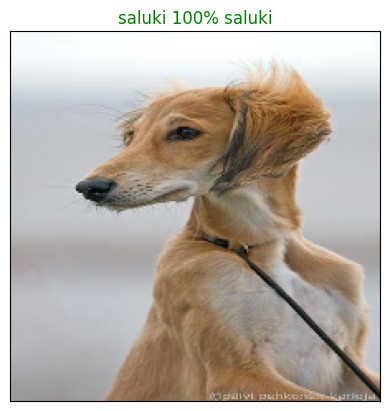

In [126]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=13)

In [142]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values,
                    color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

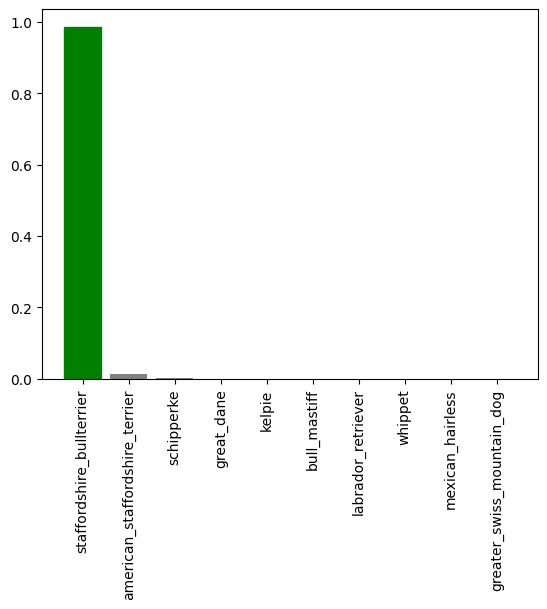

In [143]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

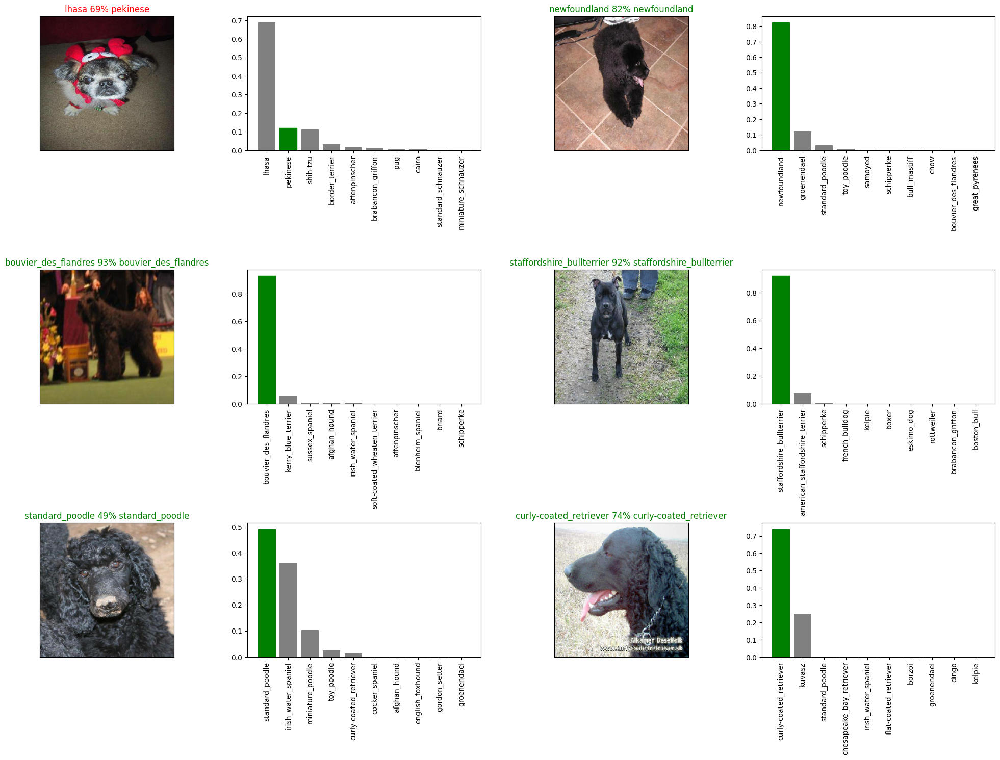

In [148]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
               labels=val_labels,
              images= val_images,
               n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and reloading a trained model

In [149]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%h%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" #save format of model
  model.save(model_path)
  return model_path

In [150]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [151]:
# Save our model trained on 1000 images
save_model(model, suffix="100-images-mobilenetv2-Adam")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/dog vision/models/20240502-May3048-100-images-mobilenetv2-Adam.h5'

In [152]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/dog vision/models/20240502-May3048-100-images-mobilenetv2-Adam.h5')

In [153]:
# Evaluate the pre-saved model
model.evaluate(val_data)

32/32 [==============================] - 63s 2s/step - loss: 0.6784 - accuracy: 0.7990


[0.6784342527389526, 0.7990000247955322]

In [154]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

32/32 [==============================] - 51s 2s/step - loss: 0.6784 - accuracy: 0.7990


[0.6784342527389526, 0.7990000247955322]

## Testing on our own images



In [168]:
custom_path = "/content/drive/MyDrive/dog vision/meus/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [169]:
custom_image_paths

['/content/drive/MyDrive/dog vision/meus/WhatsApp Image 2024-05-01 at 19.15.55.jpeg',
 '/content/drive/MyDrive/dog vision/meus/WhatsApp Image 2024-05-02 at 17.38.40.jpeg']

In [170]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [171]:
# Make predictions on the custom data
custom_preds = loaded_1000_image_model.predict(custom_data)

1/1 [==============================] - 0s 151ms/step


In [172]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['whippet', 'chihuahua']

In [173]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

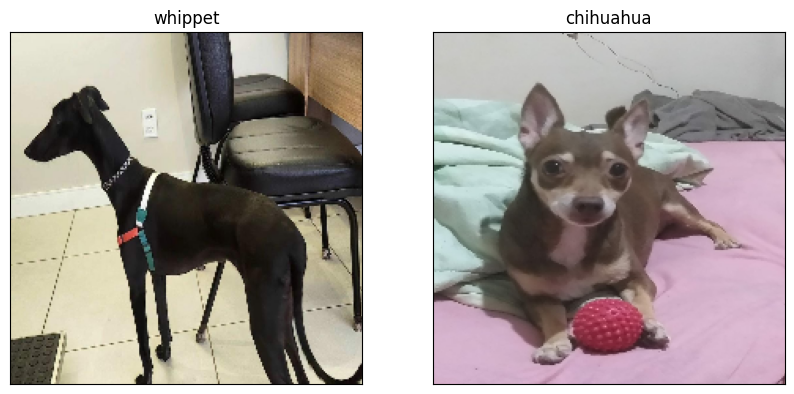

In [175]:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 2, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)